In [ ]:
import tensorflow as tf
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers, Model, Input

import time
from IPython import display

---

---

In [ ]:
def plot_images(images):

  fig = plt.figure(figsize=(4, 10))
  for i in range(40):
    plt.subplot(10, 4, i+1)
    plt.imshow(images[i, :, :, 0])
    plt.axis('off')

In [ ]:
def plot_bar(images):

  labels = []
  index = range(0,10)
  for dataset in images:
    labels.append(dataset.shape[0])

  plt.figure(figsize=(15,7))
  plt.bar(index, labels, width = 0.6)
  plt.show()

In [ ]:
def resize_data(data, compteur, minimum):

  random_generator = np.random.default_rng()
  shape = data.shape
  difference = data.shape[0] - minimum
  to_delete  = random_generator.choice(data.shape[0], size=difference, replace=False)

  data = np.delete(data, to_delete, axis=0)
  #print("Resizing:")
  #print(shape, " -> ", data.shape, "\n")
    
  return data

In [ ]:
# we can probably merge these two function
def cut_data(data, mask):

  random_generator = np.random.default_rng()

  for index, category in enumerate(data):

    size = int(category.shape[0] * (1 - mask[index]))
    shape = category.shape
    to_delete  = random_generator.choice(category.shape[0], size=size, replace=False)
    data[index] = np.delete(category, to_delete, axis=0)
    #print("Resizing:")
    #print(shape, " -> ", data[index].shape, "\n")
  
  return data

In [ ]:
def merge_shuffle_and_separate_data(data, split):

  labels = []
  for index, dataset in enumerate(data):
    labels.append(np.ones(shape=dataset.shape[0]) * index)

  data = np.concatenate(data, axis=0)
  labels = np.concatenate(labels)

  assert labels.shape[0] == data.shape[0]

  arg_shuffle = np.random.permutation(labels.shape[0])
  data    = data[arg_shuffle]
  labels  = labels[arg_shuffle]   #shuffling

  split_index = int(labels.shape[0] * (1-split))

  train_images = data[:split_index]
  test_images  = data[split_index:]

  train_labels = labels[:split_index]
  test_labels  = labels[split_index:]

  a=train_labels.shape[0]
  b=test_labels.shape[0]

  return (train_images, train_labels), (test_images, test_labels)

In [ ]:
def prepare_data(mask, split):

  # importing MNIST
  (train_images, train_labels), (test_images, test_labels) = tf.keras.datasets.mnist.load_data()

  images = np.concatenate((train_images, test_images))
  labels = np.append(train_labels, test_labels)

  """
  print("------------------------------------------------")
  print("images.shape   :    ", images.shape)
  print("------------------------------------------------")
  print("labels.shape   :    ", labels.shape)
  print("------------------------------------------------")
  """

  # could be optimized but I wanted to get something clean and lisible
  images_zero   = images[np.argwhere(labels==0)].squeeze()
  images_one    = images[np.argwhere(labels==1)].squeeze()
  images_two    = images[np.argwhere(labels==2)].squeeze()
  images_three  = images[np.argwhere(labels==3)].squeeze()
  images_four   = images[np.argwhere(labels==4)].squeeze()
  images_five   = images[np.argwhere(labels==5)].squeeze()
  images_six    = images[np.argwhere(labels==6)].squeeze()
  images_seven  = images[np.argwhere(labels==7)].squeeze()
  images_eight  = images[np.argwhere(labels==8)].squeeze()
  images_nine   = images[np.argwhere(labels==9)].squeeze()
  set_images = [images_zero, images_one, images_two, images_three, images_four, images_five, images_six, images_seven, images_eight, images_nine]

  # observing the sizes and finding the minimum size, aswell as the total (should be 70000 every time)
  counting = 0
  for index, dataset in enumerate(set_images):
    counting += dataset.shape[0]
    #print("for the category:", index, "  |  shape of the category:", dataset.shape)

  #print("\ncounting = ", counting)

  minimum = counting
  for dataset in set_images:
    if dataset.shape[0] < minimum: minimum = dataset.shape[0]
  #print("\nminimum = ", minimum)

  #plot_images(set_images)
  #plot_bar(set_images)

  for index, dataset in enumerate(set_images):
    set_images[index] = resize_data(dataset, counting, minimum)


  #plot_bar(set_images)

  non_iid_data = cut_data(set_images, mask)

  plot_bar(non_iid_data)

  (train_images, train_labels), (test_images, test_labels) = merge_shuffle_and_separate_data(non_iid_data, split)

  train_images = train_images.reshape(train_images.shape[0], train_images.shape[1], train_images.shape[2], 1)
  test_images = test_images.reshape(test_images.shape[0], test_images.shape[1], test_images.shape[2], 1)

  train_images, test_images = train_images/255, test_images/255

  print("---------------------------------------------------------")
  print("train_images: ", train_images.shape)
  print("train_labels: ", train_labels.shape)
  print("---------------------------------------------------------")
  print("test_images: ", test_images.shape)
  print("test_labels: ", test_labels.shape)
  print("---------------------------------------------------------")

  return (train_images, train_labels), (test_images, test_labels)

In [ ]:
def make_generator_model():

  model = tf.keras.Sequential()
  model.add(layers.Dense(7*7*256, use_bias=False, input_shape=(100,)))
  model.add(layers.BatchNormalization()) #normalize the input to mean 0 and std 1
  model.add(layers.LeakyReLU())

  model.add(layers.Reshape((7,7,256)))
  assert model.output_shape == (None, 7, 7, 256) # None is the batch size, this tests if the conditino is rspected, else throzs an error

  model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
  assert model.output_shape == (None, 7, 7, 128)
  model.add(layers.BatchNormalization())
  model.add(layers.LeakyReLU())

  model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
  assert model.output_shape == (None, 14, 14, 64)
  model.add(layers.BatchNormalization())
  model.add(layers.LeakyReLU())

  model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False))
  assert model.output_shape == (None, 28, 28, 1)
  model.add(layers.ReLU())

  return model

In [ ]:
def make_conditional_generator_model(noise_dim=100, nb_classes=10):

  input_labels =      Input(shape=(1,))

  layer_1 =           layers.Embedding(nb_classes, 50)(input_labels)
  layer_2 =           layers.Dense(49)(layer_1)  # 49 is not arbitrary, we want to reshape it t a 7x7 image
  layer_3 =           layers.Reshape((7, 7, 1))(layer_2)

  input_noise =       Input(shape=(noise_dim,))

  layer_4 =           layers.Dense(128*7*7)(input_noise) # to a dim that is reshapable to a 7x7 image, to merge with our labels
  layer_4_act =       layers.LeakyReLU(alpha=0.2)(layer_4)

  layer_5 =           layers.Reshape((7, 7, 128))(layer_4_act)

  layer_merge =       layers.Concatenate()([layer_5, layer_3])  # concatenating our transformed labels and our transformed noise seed

  layer_6 =           layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same')(layer_merge)
  layer_6_act =       layers.LeakyReLU(alpha=0.2)(layer_6)
  layer_7 =           layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same')(layer_6_act)
  layer_7_act =       layers.LeakyReLU(alpha=0.2)(layer_7)
  layer_final =       layers.Conv2D(1, (7, 7), activation='tanh', padding='same')(layer_7_act) # we activate here because there are no 'tanh' layer in tf.keras.layers

  model = Model([input_noise, input_labels], layer_final)

  return model

In [ ]:
def generator_loss(fake_output):
  
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [ ]:
def make_discriminator_model():

  model = tf.keras.Sequential()

  model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[28, 28, 1]))
  model.add(layers.LeakyReLU())
  model.add(layers.Dropout(0.3))

  model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
  model.add(layers.LeakyReLU())
  model.add(layers.Dropout(0.3))

  model.add(layers.Flatten())
  model.add(layers.Dense(1))

  return model

In [ ]:
def make_conditional_discriminator_model(input_shape=(28,28,1), nb_classes=10):

  input_labels =      Input(shape=(1,))  # labels input
  
  layer_1 =           layers.Embedding(input_dim=nb_classes, output_dim=50)(input_labels)
  layer_2 =           layers.Dense(input_shape[0]*input_shape[1])(layer_1)
  layer_3 =           layers.Reshape(input_shape)(layer_2)

  input_images =      Input(shape=input_shape) # images input

  layer_merge =       layers.Concatenate()([input_images, layer_3])
  layer_4 =           layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same')(layer_merge)
  layer_4_act =       layers.LeakyReLU(alpha=0.2)(layer_4)

  layer_5 =           layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same')(layer_4_act)
  layer_5_act =       layers.LeakyReLU(alpha=0.2)(layer_5)

  layer_flatten =     layers.Flatten()(layer_5_act)

  layer_6 =           layers.Dropout(0.4)(layer_flatten)
  layer_final =       layers.Dense(1, activation='sigmoid')(layer_6)

  model =             Model([input_images, input_labels], layer_final)

  return model

In [ ]:
def discriminator_loss(real_output, fake_output):

    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    
    return total_loss

In [ ]:
"""
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss  = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator      = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator  = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
"""

'\n@tf.function\ndef train_step(images):\n    noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])\n\n    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:\n      generated_images = generator(noise, training=True)\n\n      real_output = discriminator(images, training=True)\n      fake_output = discriminator(generated_images, training=True)\n\n      gen_loss  = generator_loss(fake_output)\n      disc_loss = discriminator_loss(real_output, fake_output)\n\n    gradients_of_generator      = gen_tape.gradient(gen_loss, generator.trainable_variables)\n    gradients_of_discriminator  = disc_tape.gradient(disc_loss, discriminator.trainable_variables)\n\n    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))\n    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))\n'

In [ ]:
@tf.function
def c_train_step(images, labels):

    noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])
    labels_fake = np.random.randint(0, 100, (BATCH_SIZE,))
    seed=([noise, labels_fake])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = c_generator(seed, training=True)

      real_output = c_discriminator( ([images           , labels])        , training=True)
      fake_output = c_discriminator( ([generated_images , labels_fake])   , training=True)

      gen_loss  = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator      = gen_tape.gradient(gen_loss, c_generator.trainable_variables)
    gradients_of_discriminator  = disc_tape.gradient(disc_loss, c_discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, c_generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, c_discriminator.trainable_variables))

    print("\n\ngen_loss=", gen_loss, "  | disc_loss=",disc_loss)

In [ ]:
"""
def train(dataset, epochs):
  for epoch in range(epochs):
    start = time.time()

    for image_batch in dataset:
      train_step(image_batch)

    display.clear_output(wait=True)
    generate_and_save_images(generator,
                             epoch + 1,
                             seed)

    if (epoch + 1) % 15 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

  display.clear_output(wait=True)
  generate_and_save_images(generator,
                           epochs,
                           seed)
"""

"\ndef train(dataset, epochs):\n  for epoch in range(epochs):\n    start = time.time()\n\n    for image_batch in dataset:\n      train_step(image_batch)\n\n    display.clear_output(wait=True)\n    generate_and_save_images(generator,\n                             epoch + 1,\n                             seed)\n\n    if (epoch + 1) % 15 == 0:\n      checkpoint.save(file_prefix = checkpoint_prefix)\n\n    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))\n\n  display.clear_output(wait=True)\n  generate_and_save_images(generator,\n                           epochs,\n                           seed)\n"

In [ ]:
def c_train(dataset, epochs):
  for epoch in range(epochs):
    start = time.time()

    for image_batch, labels_batch in dataset:
      c_train_step(image_batch, labels_batch)

    #display.clear_output(wait=True)
    c_generate_and_save_images(c_generator,
                             epoch + 1)

    if (epoch + 1) % 15 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

  #display.clear_output(wait=True)
  c_generate_and_save_images(c_generator,
                           epochs)

In [ ]:
def generate_and_save_images(model, epoch, test_input):

  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(10, 10))

  for i in range(predictions.shape[0]):
      plt.subplot(8, 8, i+1)
      plt.imshow(predictions[i, :, :, 0], cmap='gray')
      plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

In [ ]:
def c_generate_and_save_images(model, epoch):

  n_classes = 10
  n_exemp = 6
  fig = plt.figure(figsize=(10, 10))

  noise = tf.random.normal([n_exemp, NOISE_DIM])


  for i in range(n_classes):

    labels = np.ones(n_exemp) * i
    seed = ([noise, labels])
    predictions = model(seed, training=False)

    for j in range(predictions.shape[0]):
      plt.subplot(10, 6, i*n_exemp+j+1)
      plt.imshow(predictions[j, :, :, 0], cmap='gray')
      plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

In [ ]:
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

---
---
---

# **Unconditinal GAN:**

11501568/11490434 [==============================] - 0s 0us/step


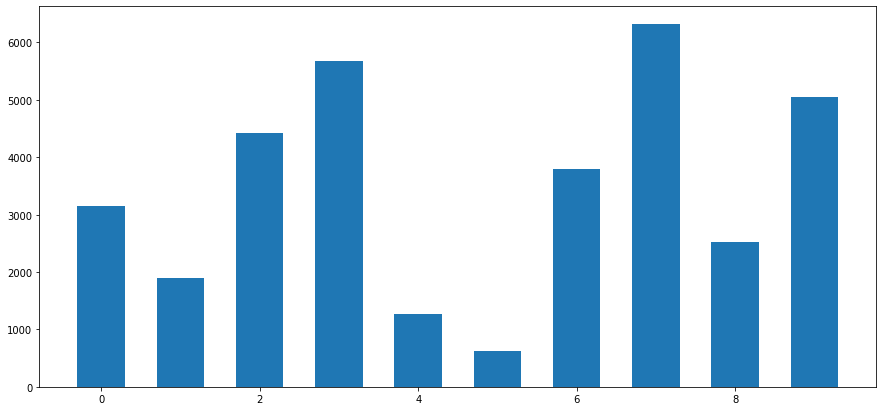

---------------------------------------------------------
train_images:  (34726, 28, 28, 1)
train_labels:  (34726,)
---------------------------------------------------------
test_images:  (0, 28, 28, 1)
test_labels:  (0,)
---------------------------------------------------------


In [ ]:
mask_even   = [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]   # iid dataset
mask        = [0.5, 0.3, 0.7, 0.9, 0.2, 0.1, 0.6, 1, 0.4, 0.8]   # random non_iid dataset
split       = 0   # train and test split percentage, 0.3 means 70% of training data and 30% fo test data

(train_images, train_labels), (test_images, test_labels) = prepare_data(mask, split)   # <---  modify here

In [ ]:
BUFFER_SIZE = train_labels.shape[0] + test_labels.shape[0]
BATCH_SIZE  = 256

train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

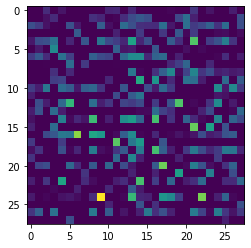

In [ ]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0]);

In [ ]:
discriminator = make_discriminator_model()

generated_answer = discriminator(generated_image, training=False)
print(generated_answer)

tf.Tensor([[-0.00169658]], shape=(1, 1), dtype=float32)


In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

generator_optimizer       = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer   = tf.keras.optimizers.Adam(1e-4)

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [ ]:
EPOCHS = 100
NOISE_DIM = 100
NB_EXEMP = 64

seed = tf.random.normal([NB_EXEMP, NOISE_DIM])

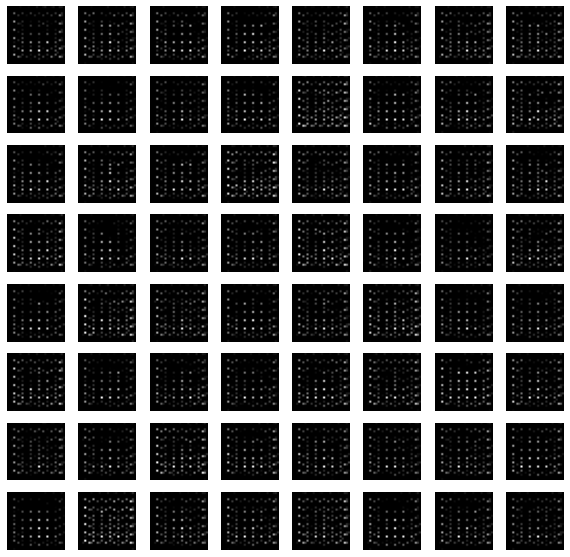

Time for epoch 1 is 12.720975637435913 sec


KeyboardInterrupt: ignored

In [ ]:
train(train_dataset, EPOCHS)

In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

In [ ]:
display_image(EPOCHS)

In [ ]:
anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

In [ ]:
!pip install git+https://github.com/tensorflow/docs

In [ ]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

---
---
---
# **Conditional GAN:**

11501568/11490434 [==============================] - 0s 0us/step


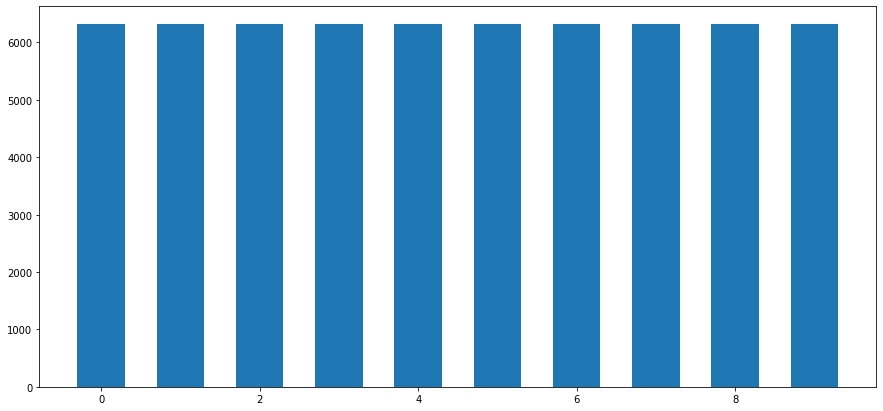

---------------------------------------------------------
train_images:  (63130, 28, 28, 1)
train_labels:  (63130,)
---------------------------------------------------------
test_images:  (0, 28, 28, 1)
test_labels:  (0,)
---------------------------------------------------------


In [ ]:
mask_even   = [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]   # iid dataset
mask        = [0.5, 0.3, 0.7, 0.9, 0.2, 0.1, 0.6, 1, 0.4, 0.8]   # random non_iid dataset
split       = 0   # train and test split percentage, 0.3 means 70% of training data and 30% fo test data

(train_images, train_labels), (test_images, test_labels) = prepare_data(mask_even, split)   # <---  modify here

In [ ]:
BUFFER_SIZE = train_labels.shape[0] + test_labels.shape[0]
BATCH_SIZE  = 256

train_dataset = tf.data.Dataset.from_tensor_slices((train_images, train_labels)).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

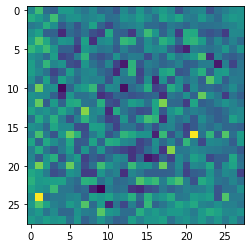

In [ ]:
c_generator = make_conditional_generator_model()

noise = tf.random.normal([1, 100])
label = np.random.randint(0, 10, (1,))
seed = ([noise, label])
c_generated_image = c_generator(seed, training=False)

plt.imshow(c_generated_image[0, :, :, 0]);

In [ ]:
c_discriminator = make_conditional_discriminator_model()

input_disc = ([c_generated_image, label])
c_generated_answer = c_discriminator(input_disc, training=False)
print(c_generated_answer)

tf.Tensor([[0.4996606]], shape=(1, 1), dtype=float32)


In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy()

generator_optimizer       = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer   = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=c_generator,
                                 discriminator=c_discriminator)

In [ ]:
EPOCHS = 100
NOISE_DIM = 100



gen_loss= Tensor("binary_crossentropy/weighted_loss/value:0", shape=(), dtype=float32)   | disc_loss= Tensor("add:0", shape=(), dtype=float32)


gen_loss= Tensor("binary_crossentropy/weighted_loss/value:0", shape=(), dtype=float32)   | disc_loss= Tensor("add:0", shape=(), dtype=float32)


gen_loss= Tensor("binary_crossentropy/weighted_loss/value:0", shape=(), dtype=float32)   | disc_loss= Tensor("add:0", shape=(), dtype=float32)


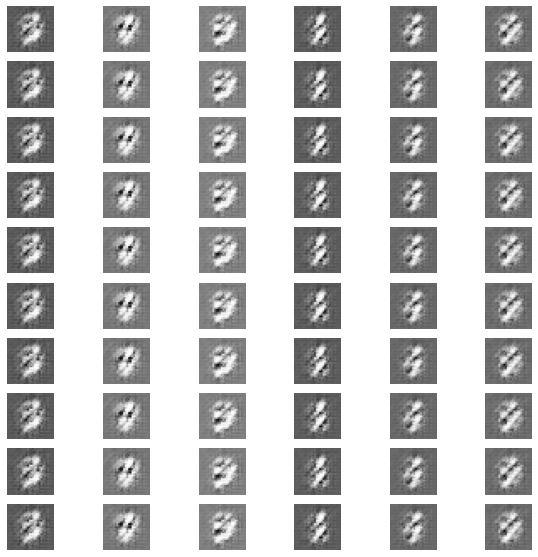

Time for epoch 1 is 28.26777482032776 sec


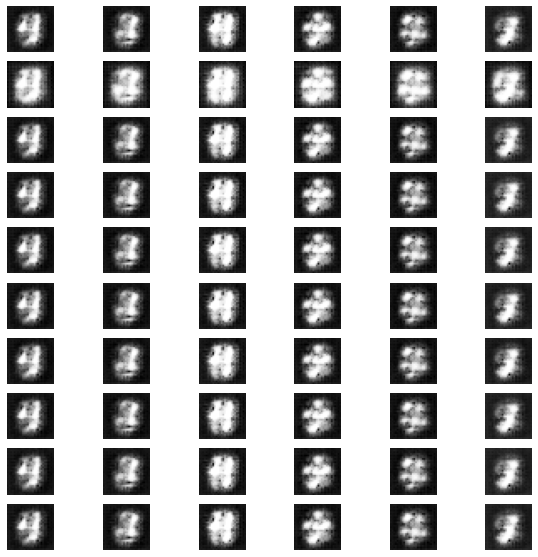

Time for epoch 2 is 24.196250200271606 sec


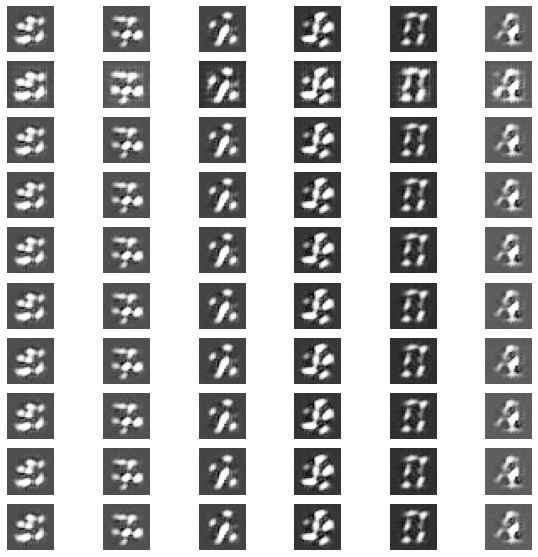

Time for epoch 3 is 24.774394035339355 sec


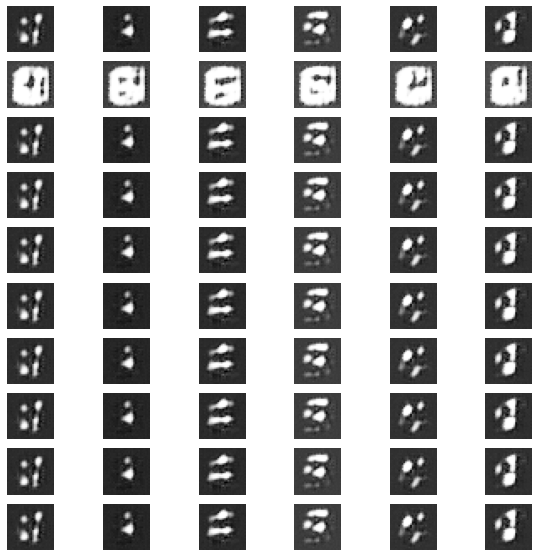

Time for epoch 4 is 25.379221439361572 sec


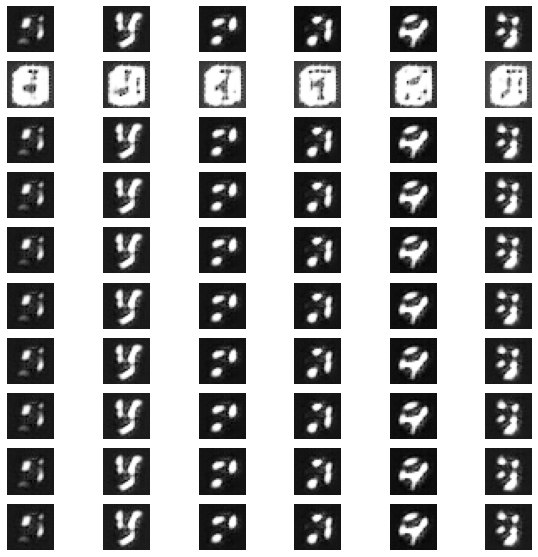

Time for epoch 5 is 25.09158754348755 sec


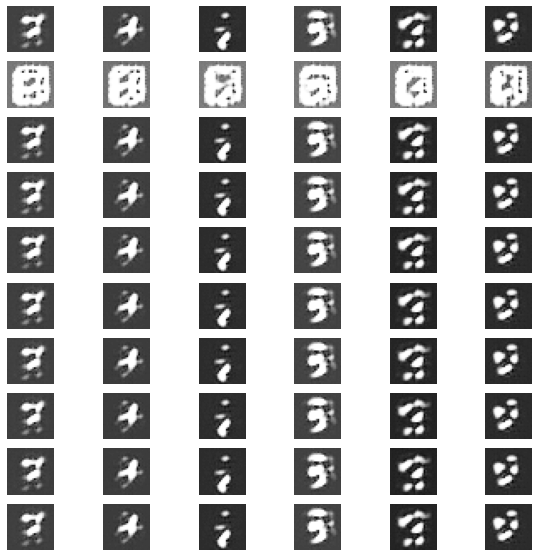

Time for epoch 6 is 24.79995083808899 sec


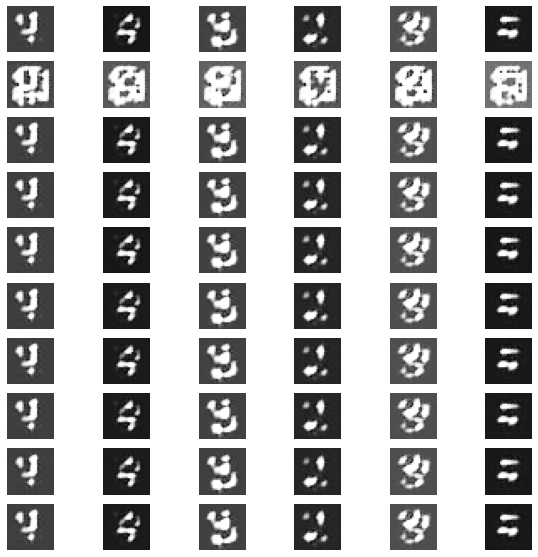

Time for epoch 7 is 24.995050191879272 sec


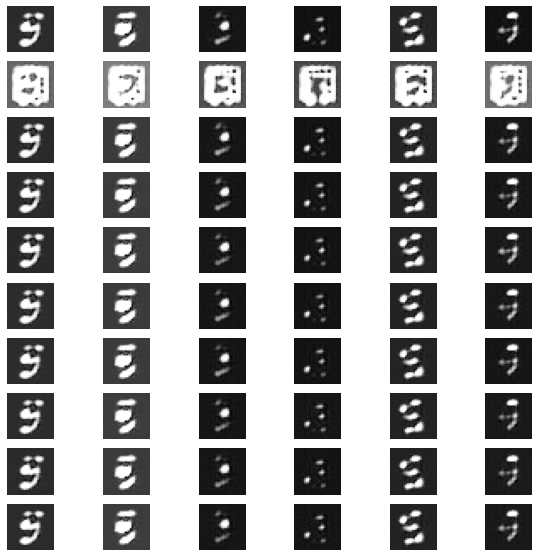

Time for epoch 8 is 25.22169518470764 sec


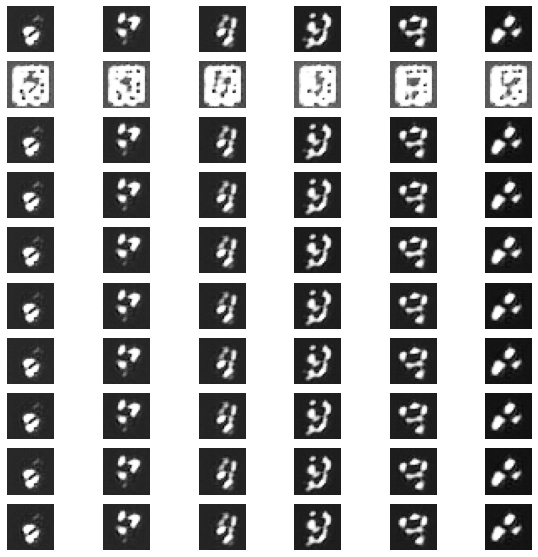

Time for epoch 9 is 25.005322217941284 sec


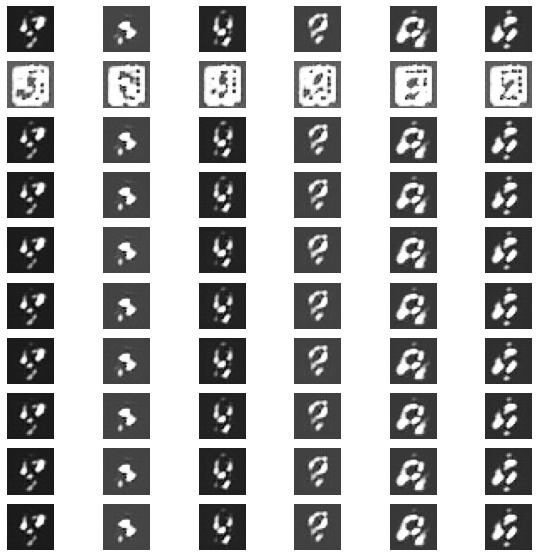

Time for epoch 10 is 25.00371265411377 sec


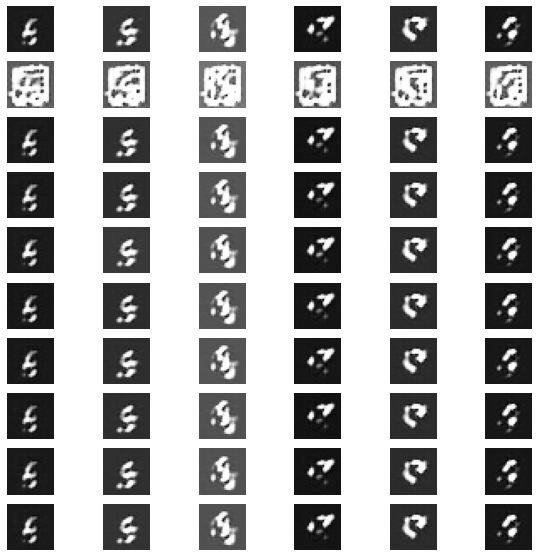

Time for epoch 11 is 25.081891775131226 sec


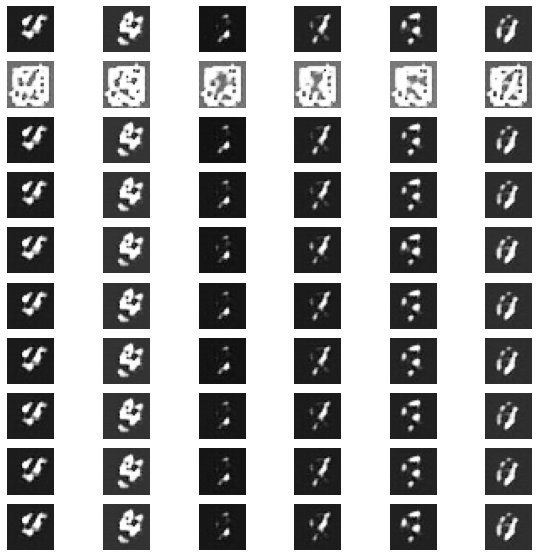

Time for epoch 12 is 25.013601779937744 sec


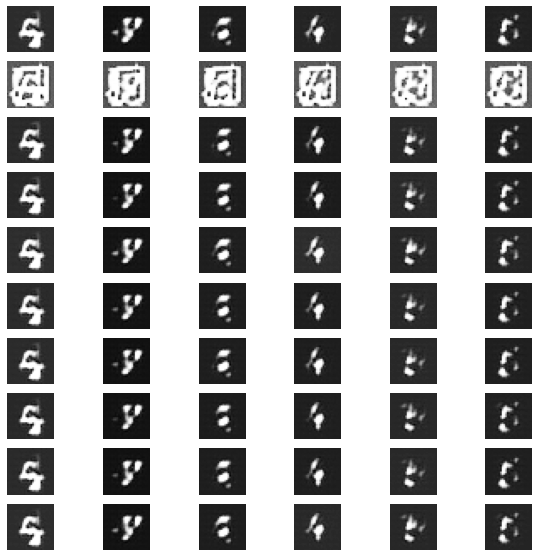

Time for epoch 13 is 25.05938696861267 sec


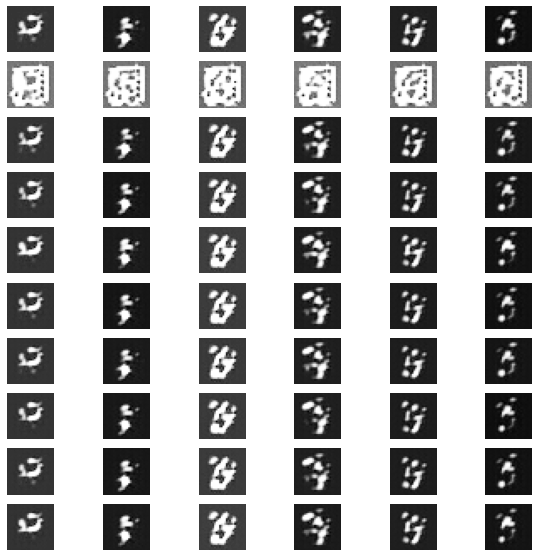

Time for epoch 14 is 24.868475437164307 sec


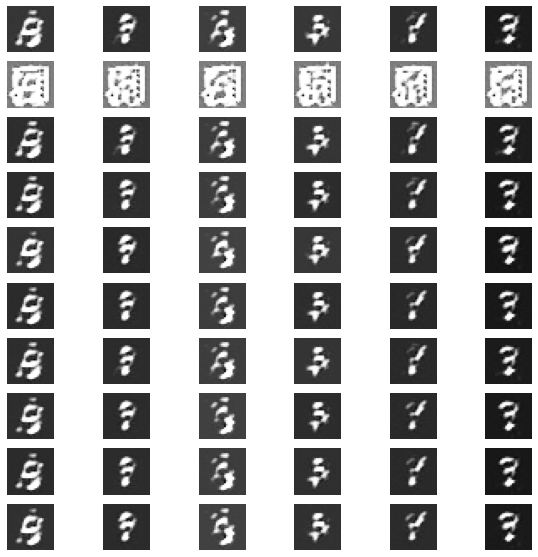

Time for epoch 15 is 25.178688764572144 sec


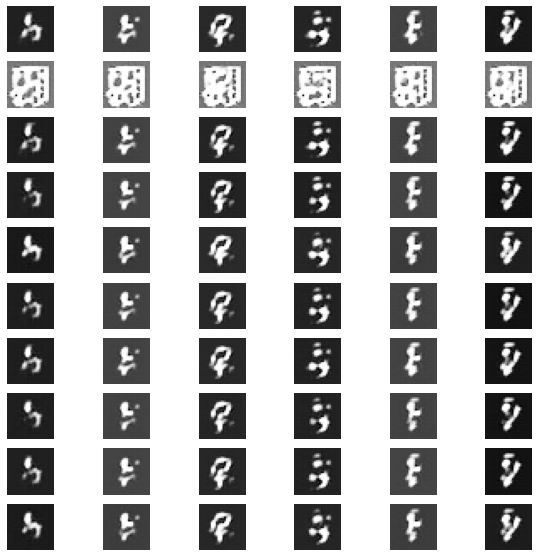

Time for epoch 16 is 25.084506273269653 sec


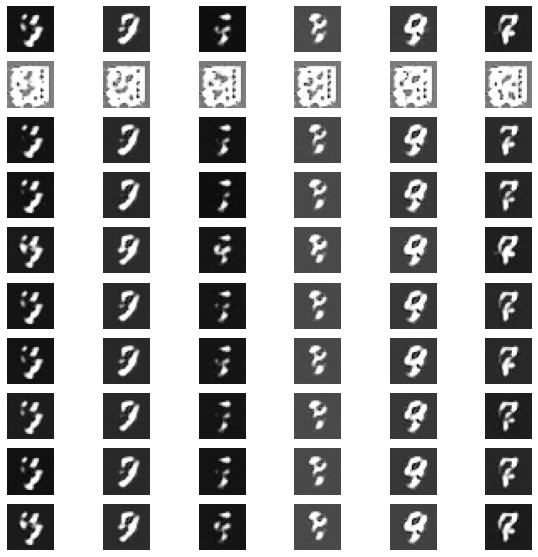

Time for epoch 17 is 24.857311964035034 sec


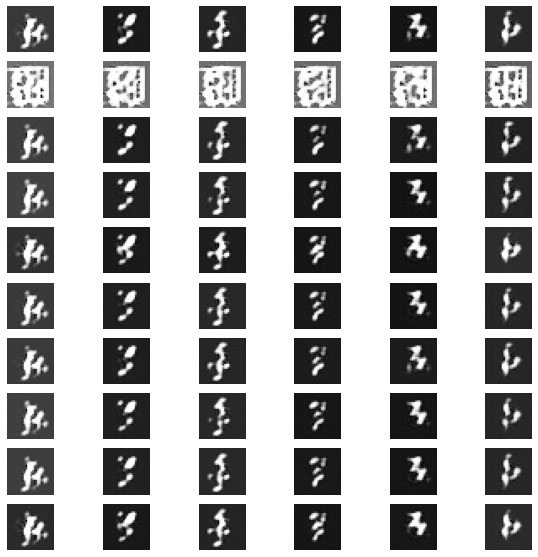

Time for epoch 18 is 24.99199676513672 sec


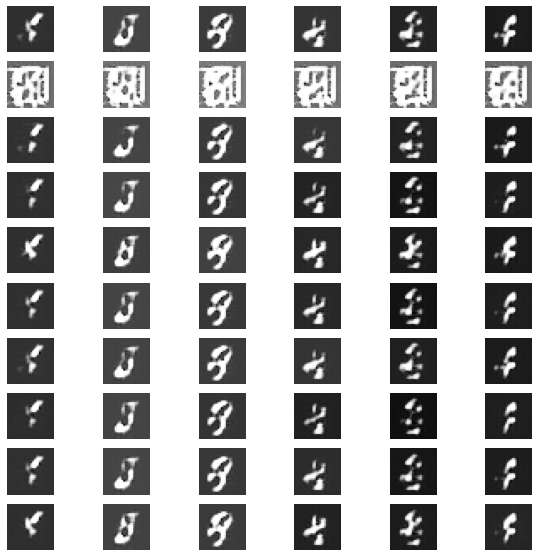

Time for epoch 19 is 25.147976398468018 sec


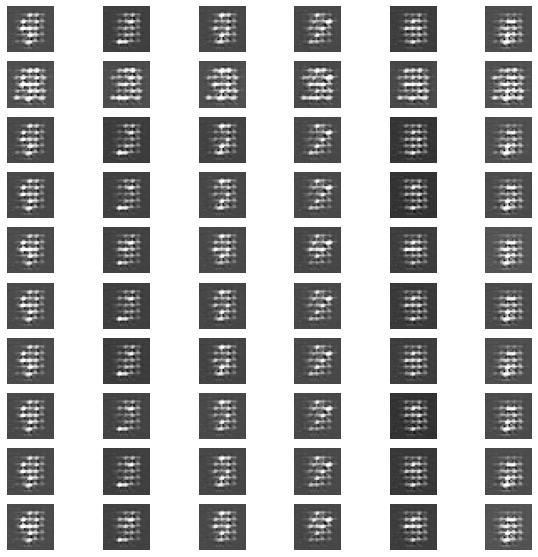

Time for epoch 20 is 24.98726773262024 sec


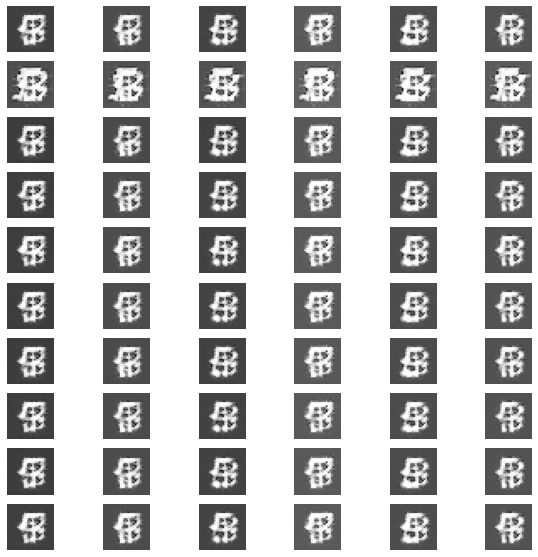

Time for epoch 21 is 24.997476816177368 sec


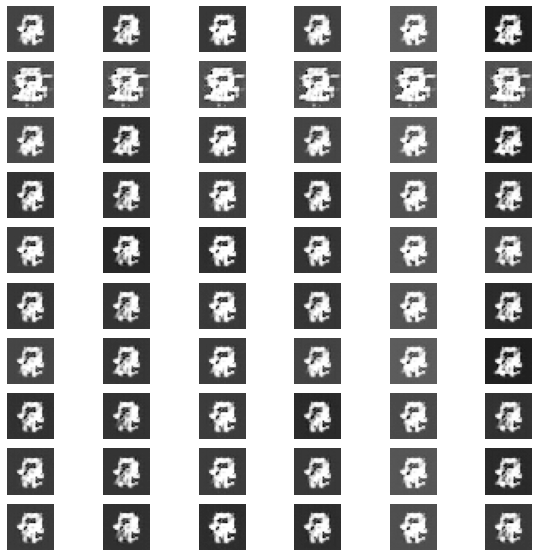

Time for epoch 22 is 25.124038696289062 sec


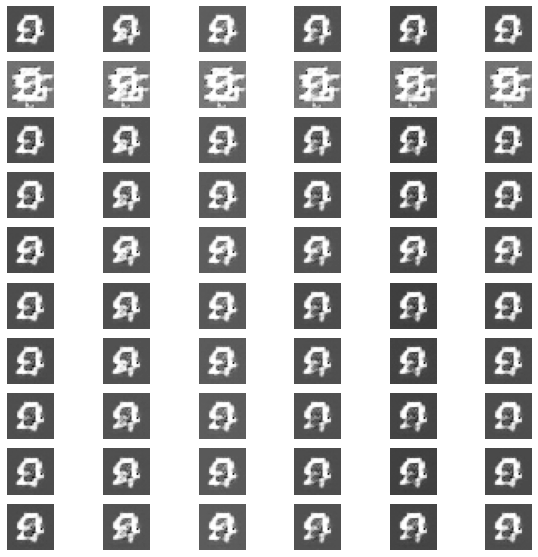

Time for epoch 23 is 25.023197174072266 sec


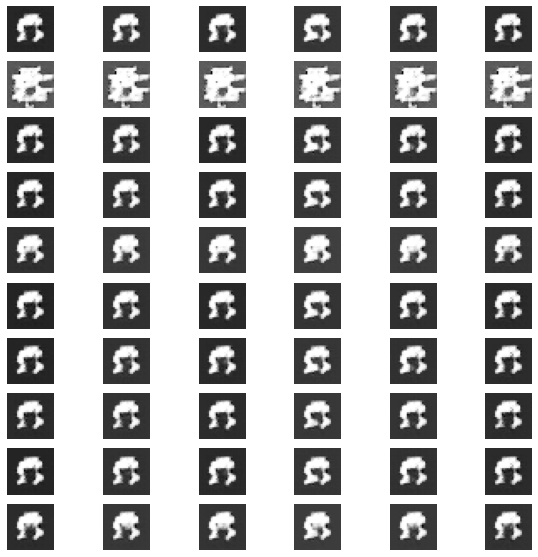

Time for epoch 24 is 24.89516258239746 sec


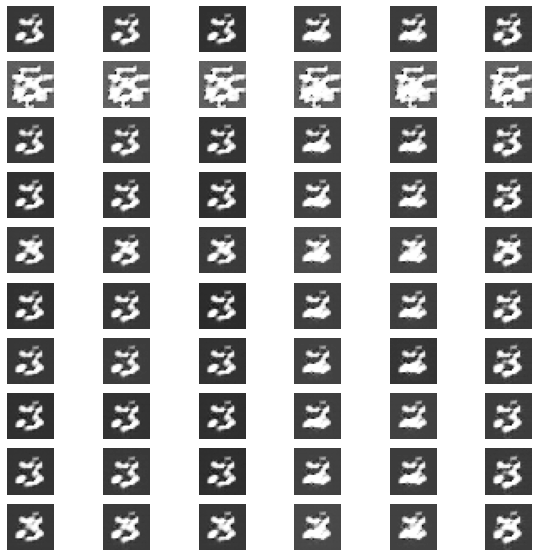

Time for epoch 25 is 24.967020511627197 sec


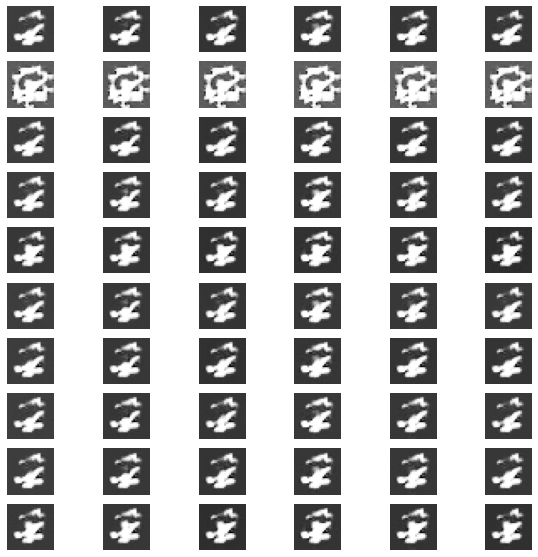

Time for epoch 26 is 25.02056336402893 sec


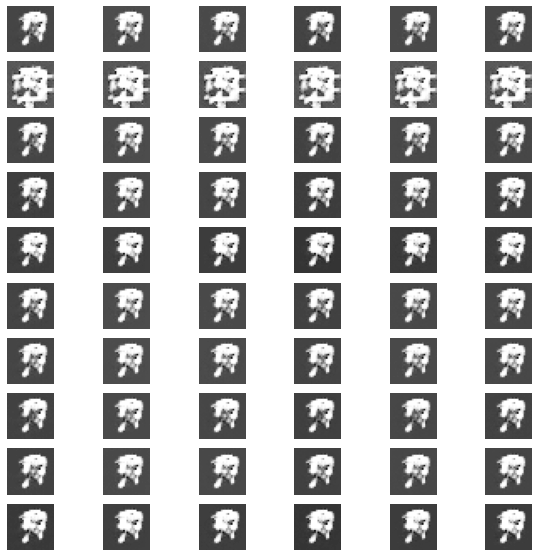

Time for epoch 27 is 24.9953031539917 sec


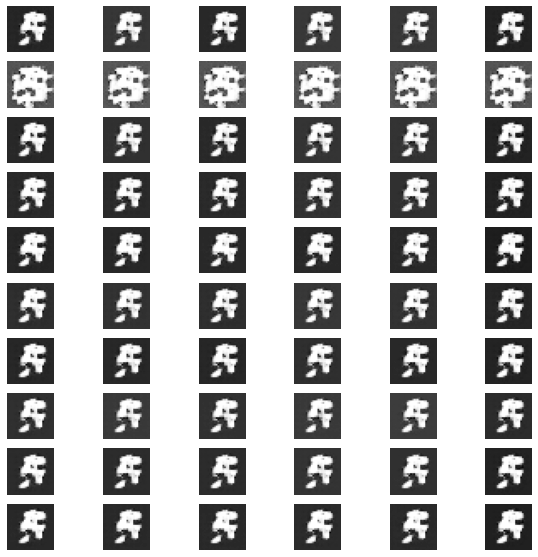

Time for epoch 28 is 24.99166965484619 sec


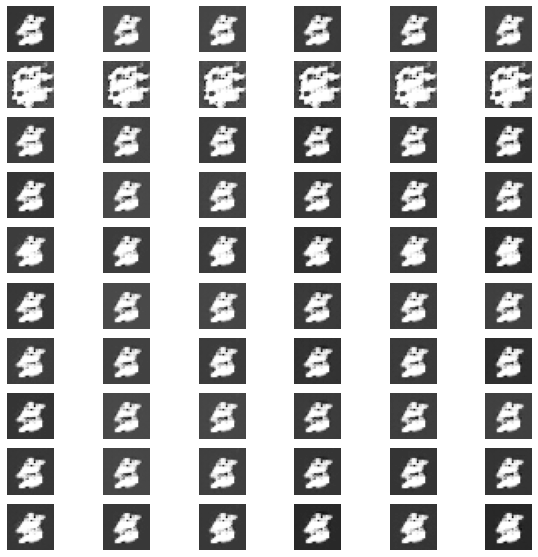

Time for epoch 29 is 24.947746515274048 sec


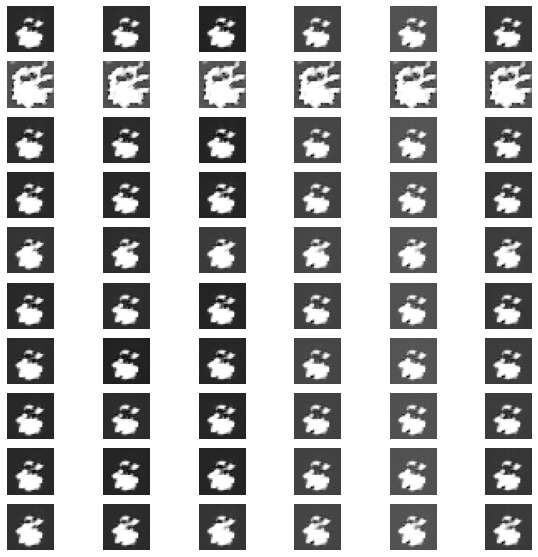

Time for epoch 30 is 25.011602878570557 sec


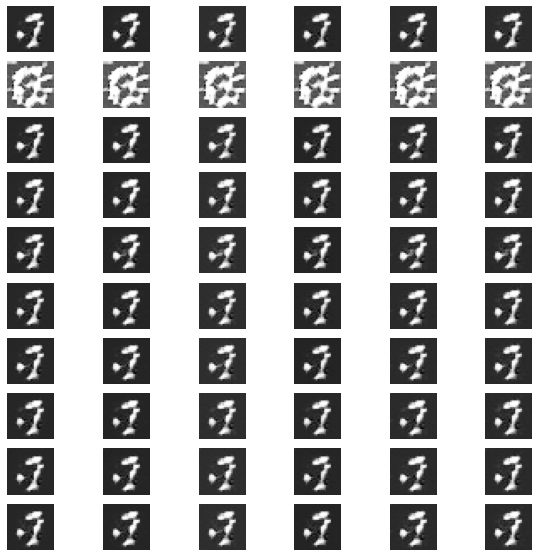

Time for epoch 31 is 24.90130376815796 sec


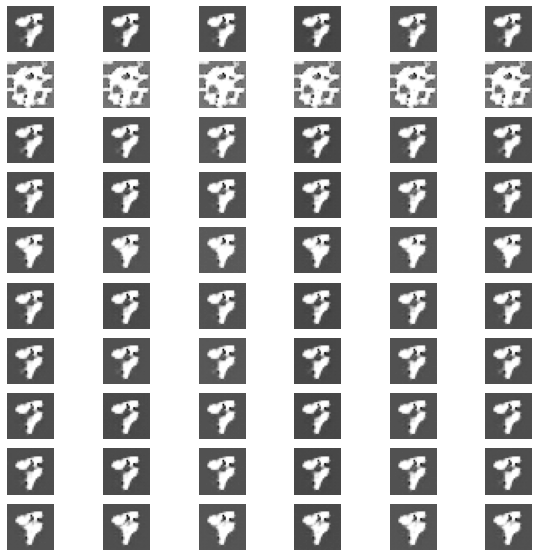

Time for epoch 32 is 25.0448739528656 sec


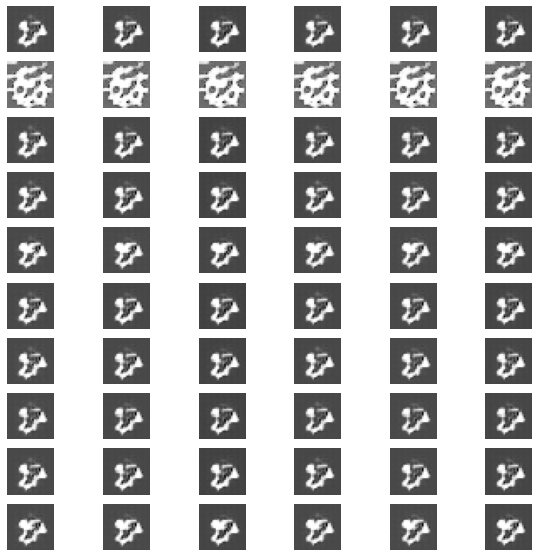

Time for epoch 33 is 25.012903690338135 sec


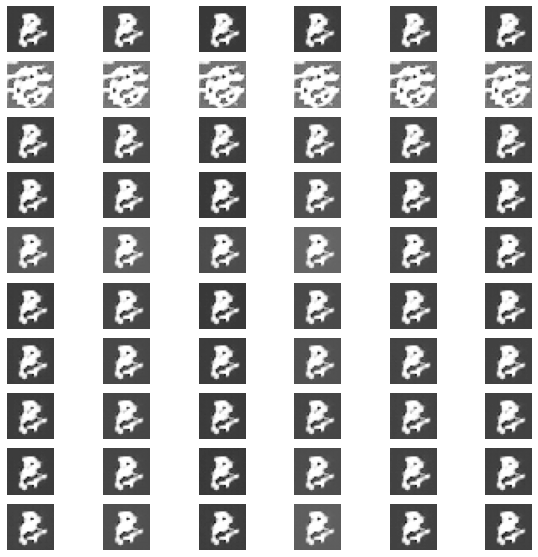

Time for epoch 34 is 24.85896325111389 sec


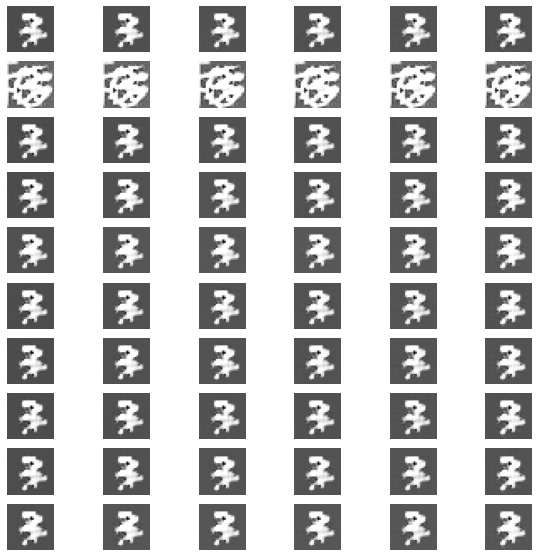

Time for epoch 35 is 24.889296293258667 sec


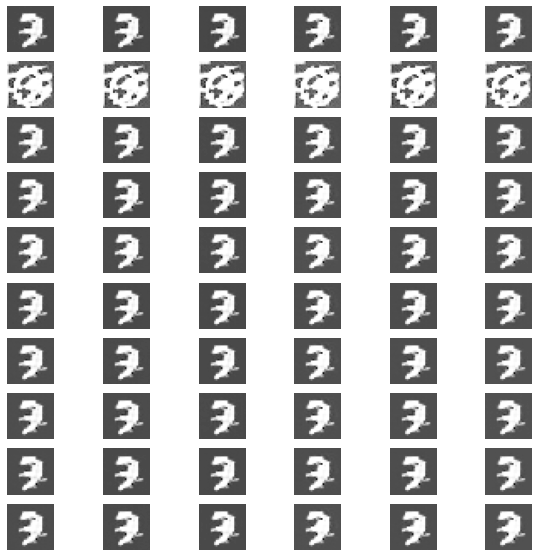

Time for epoch 36 is 25.015140295028687 sec


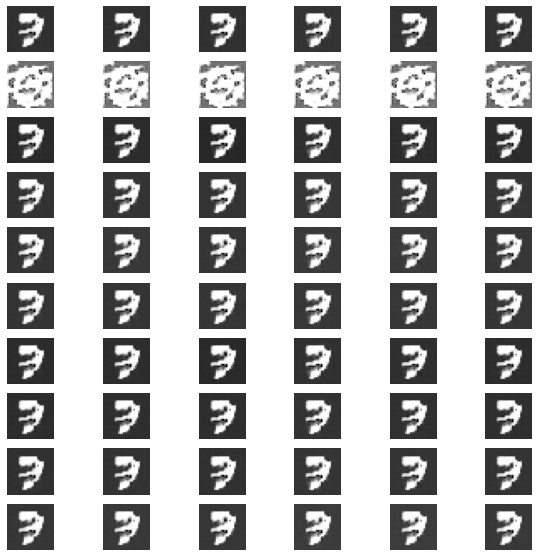

Time for epoch 37 is 24.887675285339355 sec


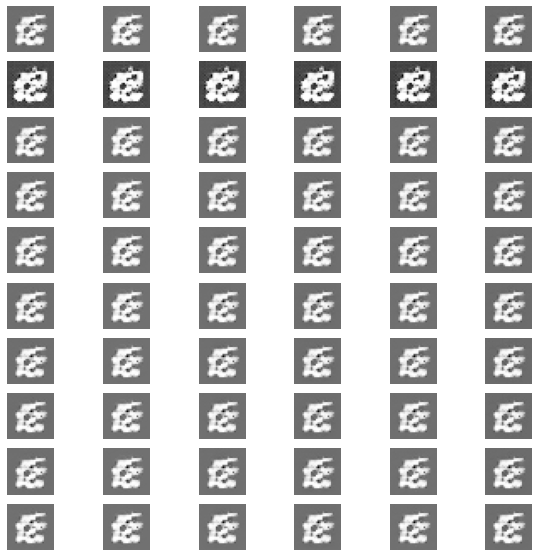

Time for epoch 38 is 24.879633903503418 sec


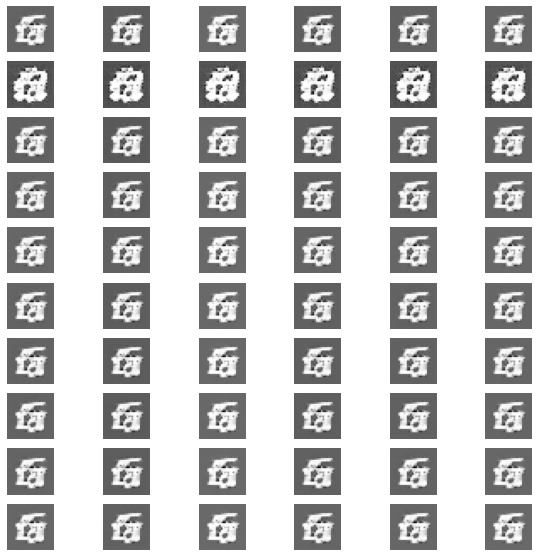

Time for epoch 39 is 24.908607721328735 sec


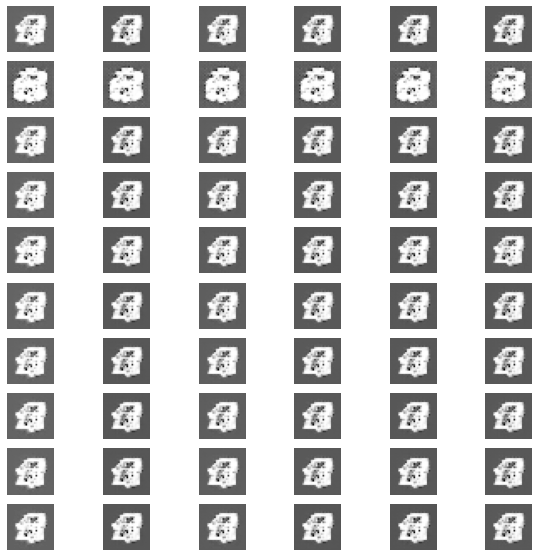

Time for epoch 40 is 24.893544673919678 sec


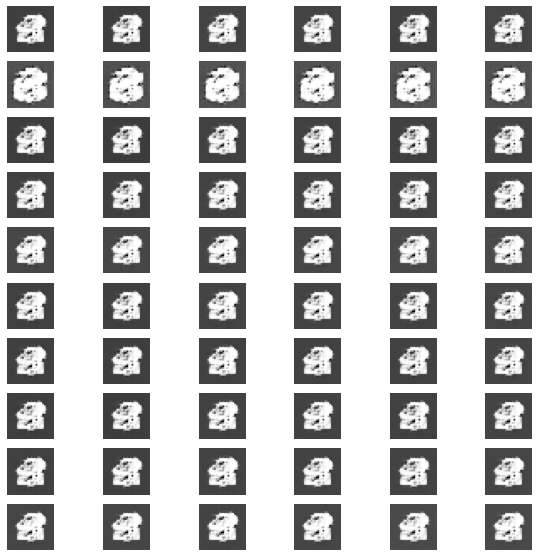

Time for epoch 41 is 24.926480770111084 sec


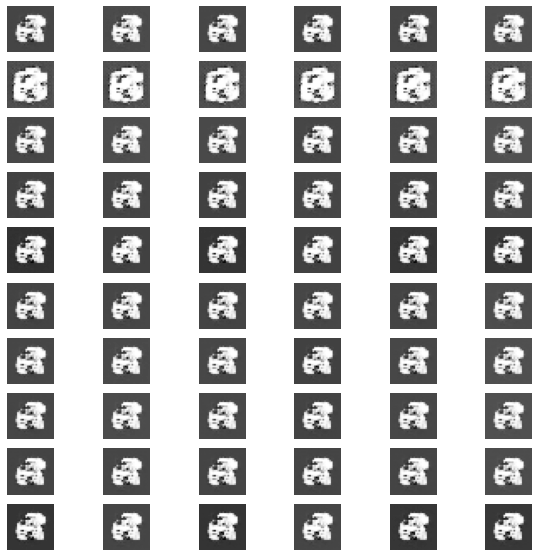

Time for epoch 42 is 24.98510217666626 sec


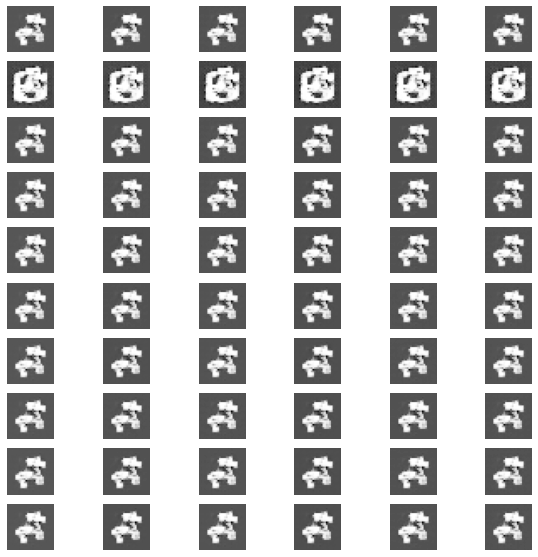

Time for epoch 43 is 24.942989826202393 sec


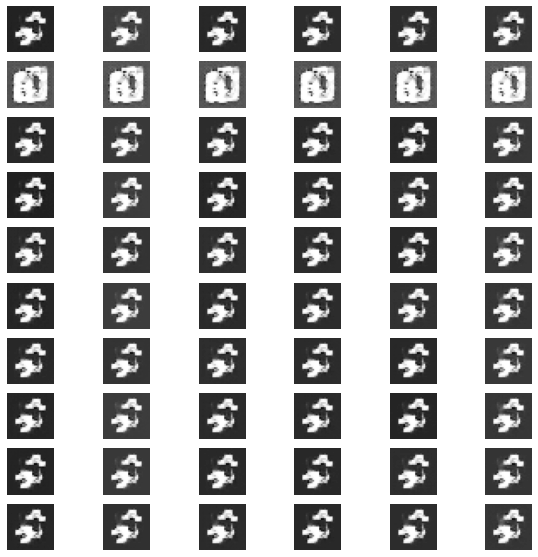

Time for epoch 44 is 24.8228120803833 sec


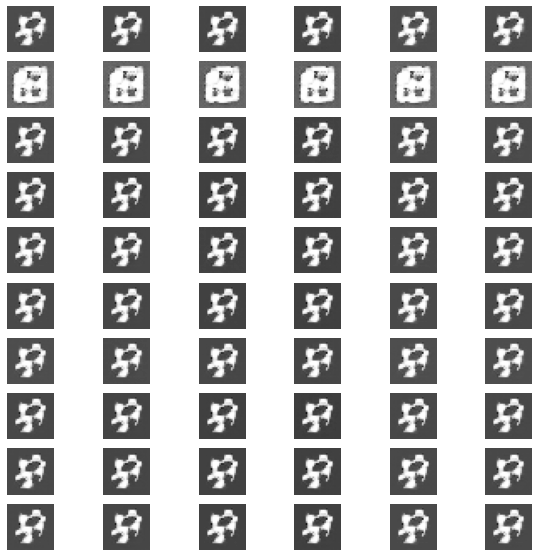

Time for epoch 45 is 25.090278387069702 sec


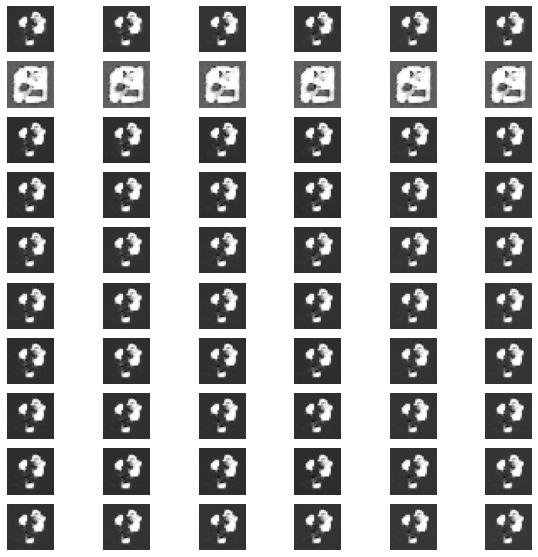

Time for epoch 46 is 25.111180067062378 sec


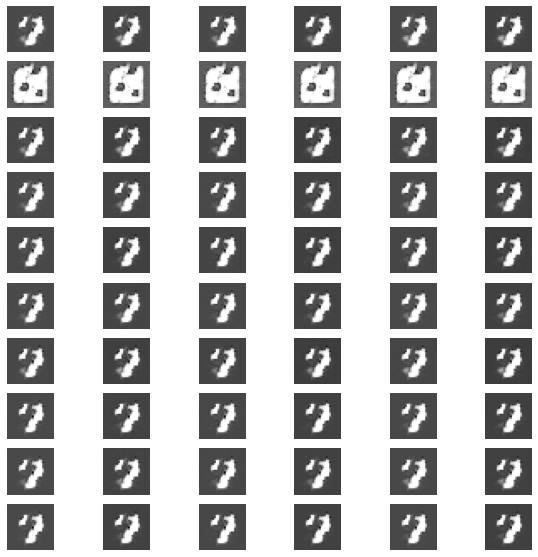

Time for epoch 47 is 24.84698724746704 sec


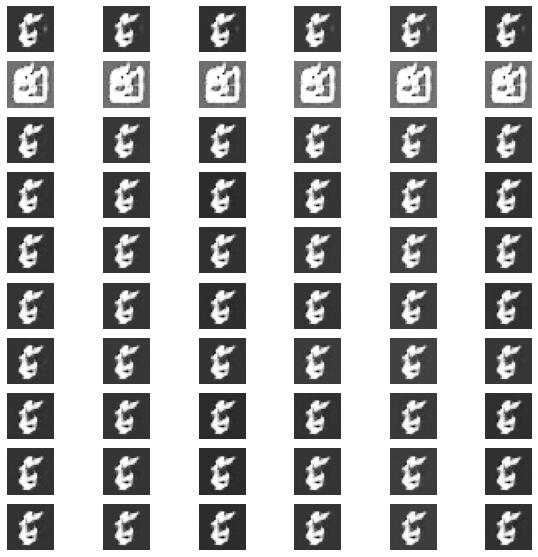

Time for epoch 48 is 24.954334259033203 sec


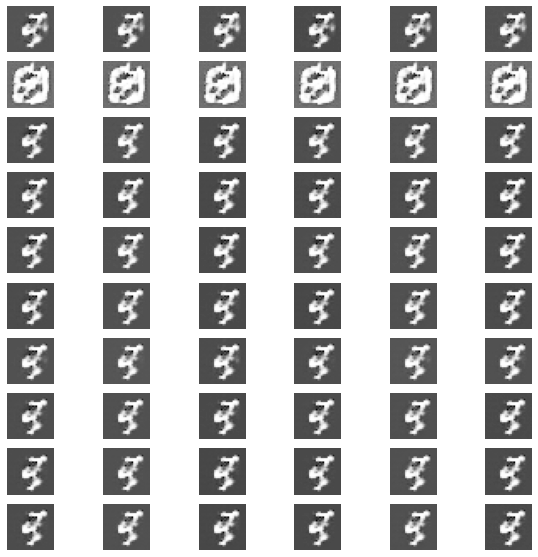

Time for epoch 49 is 24.992794513702393 sec


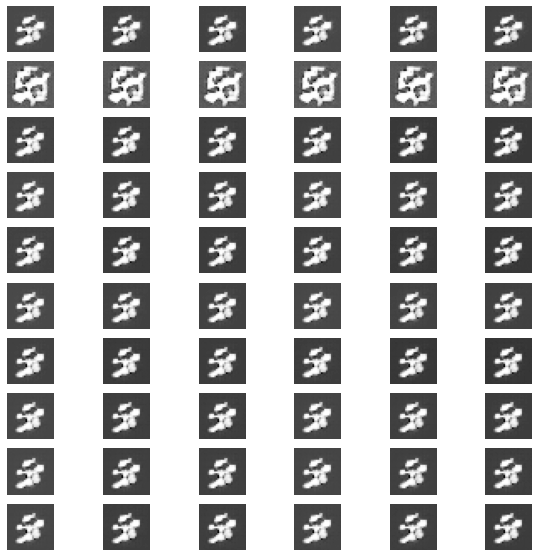

Time for epoch 50 is 24.882367849349976 sec


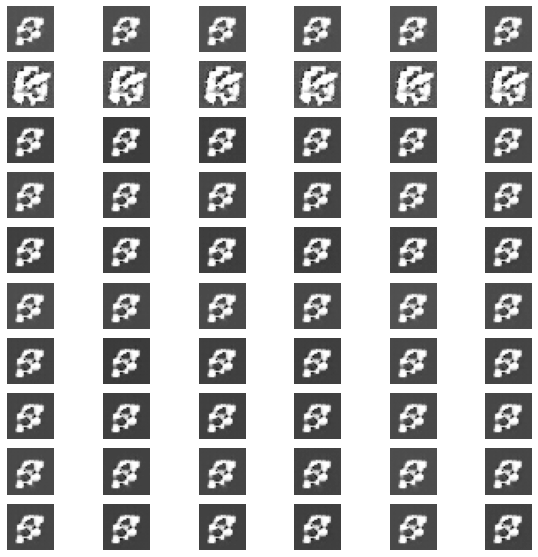

Time for epoch 51 is 25.057974338531494 sec


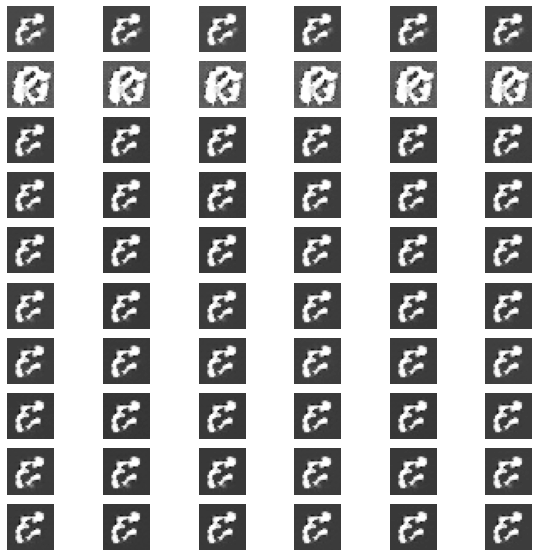

Time for epoch 52 is 24.95444941520691 sec


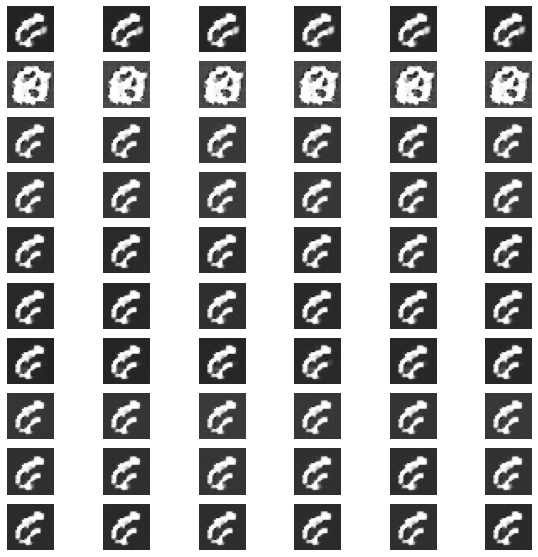

Time for epoch 53 is 24.829813241958618 sec


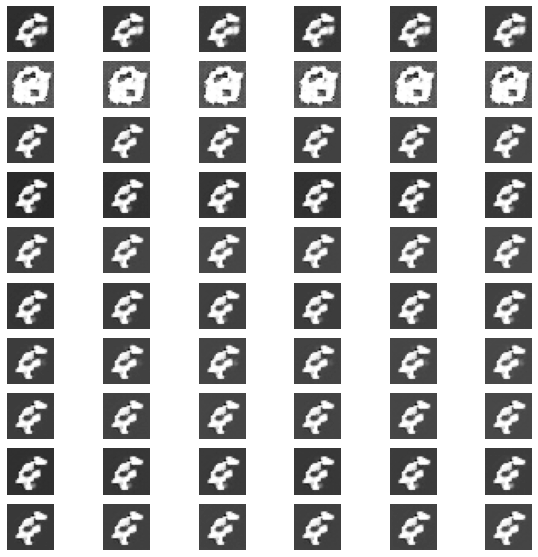

Time for epoch 54 is 24.95035481452942 sec


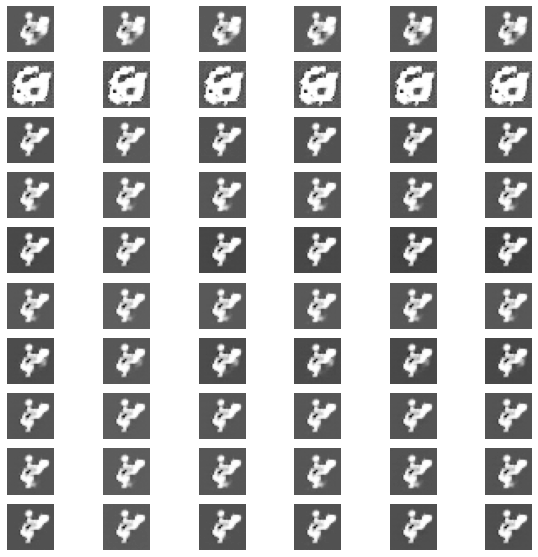

Time for epoch 55 is 24.853705406188965 sec


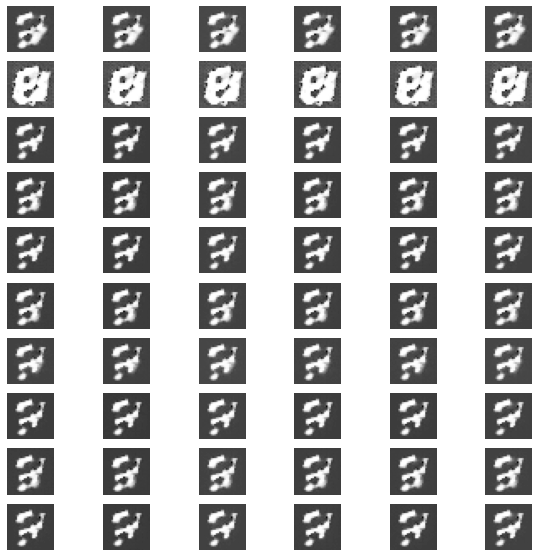

Time for epoch 56 is 25.02200412750244 sec


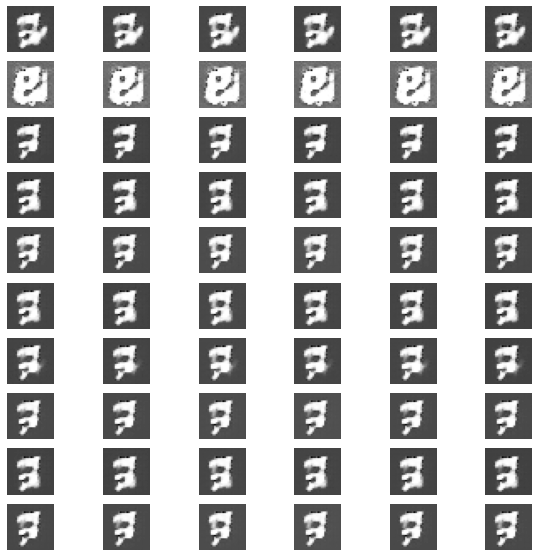

Time for epoch 57 is 24.86072611808777 sec


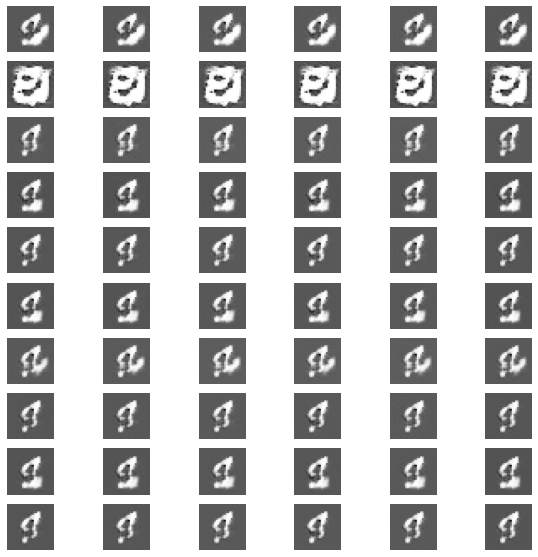

Time for epoch 58 is 24.86988115310669 sec


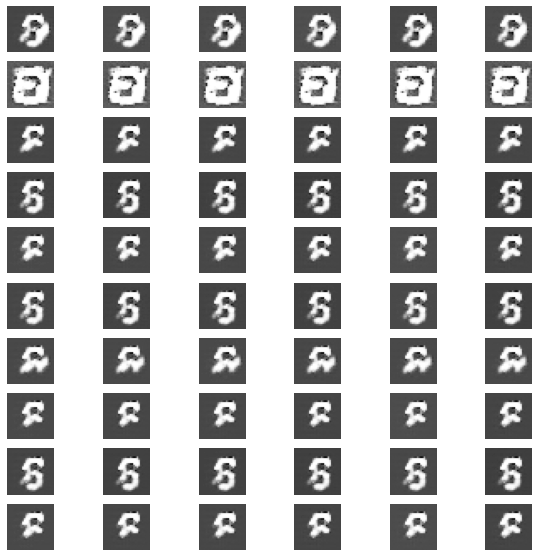

Time for epoch 59 is 24.91590166091919 sec


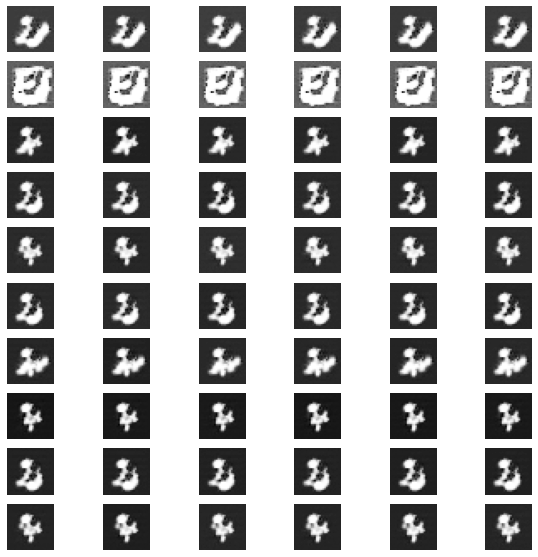

Time for epoch 60 is 24.970832347869873 sec


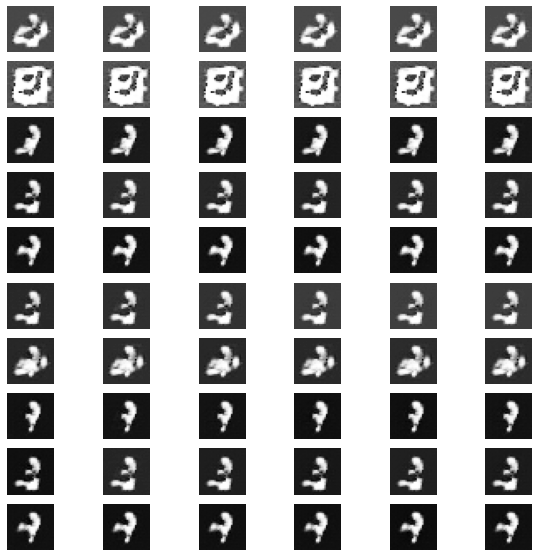

Time for epoch 61 is 24.911694526672363 sec


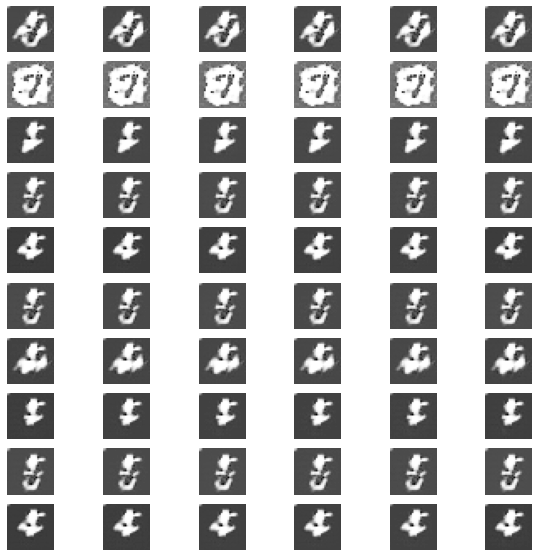

Time for epoch 62 is 24.90712571144104 sec


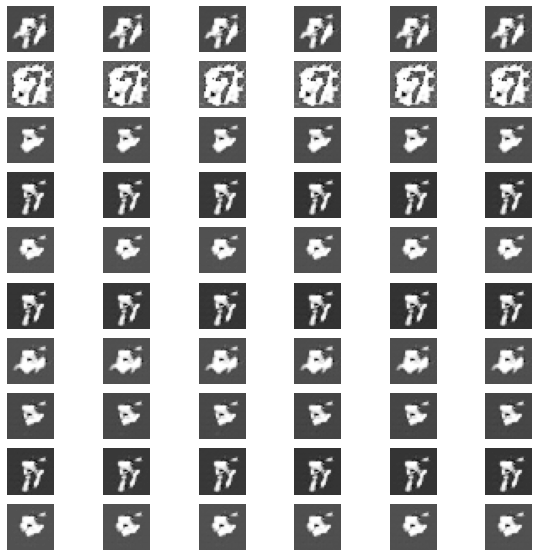

Time for epoch 63 is 24.81827425956726 sec


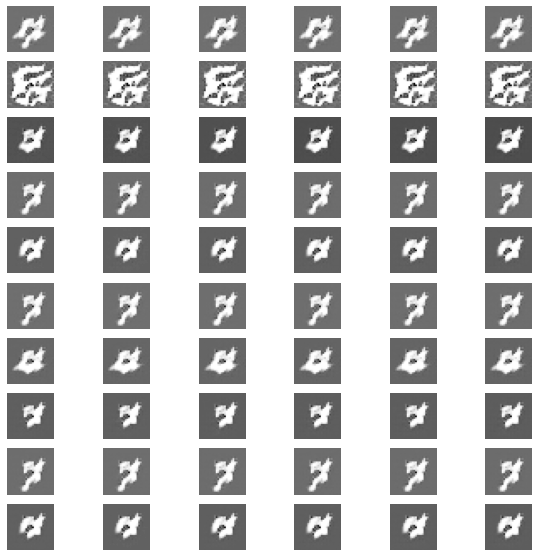

Time for epoch 64 is 25.084420680999756 sec


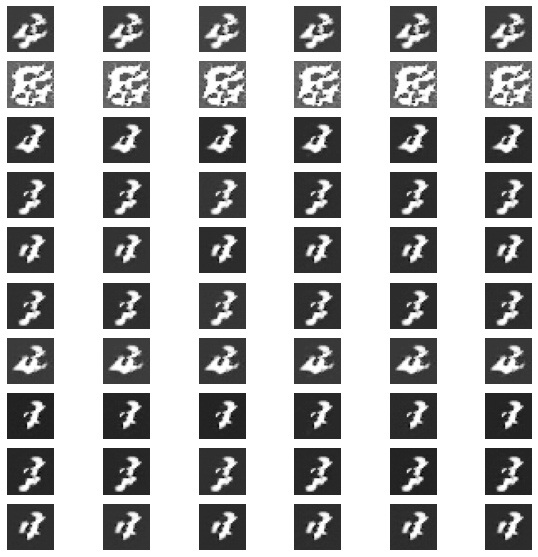

Time for epoch 65 is 24.943199396133423 sec


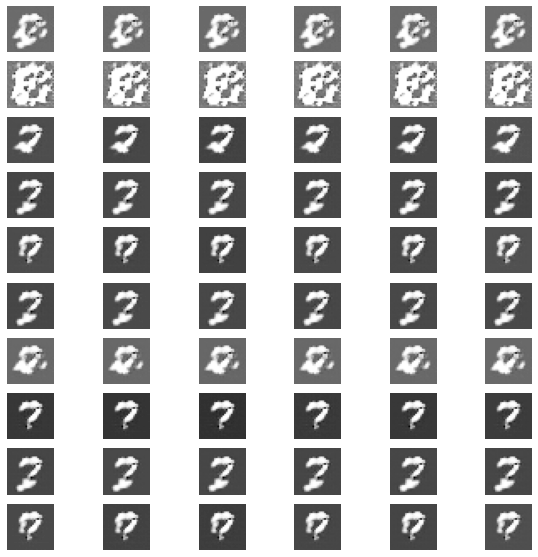

Time for epoch 66 is 24.793573141098022 sec


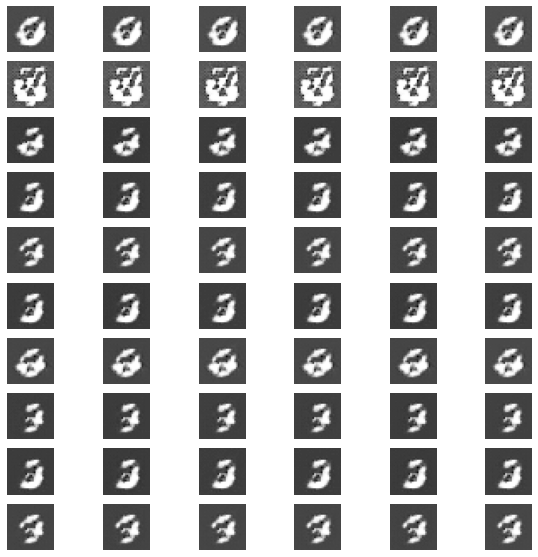

Time for epoch 67 is 24.958131313323975 sec


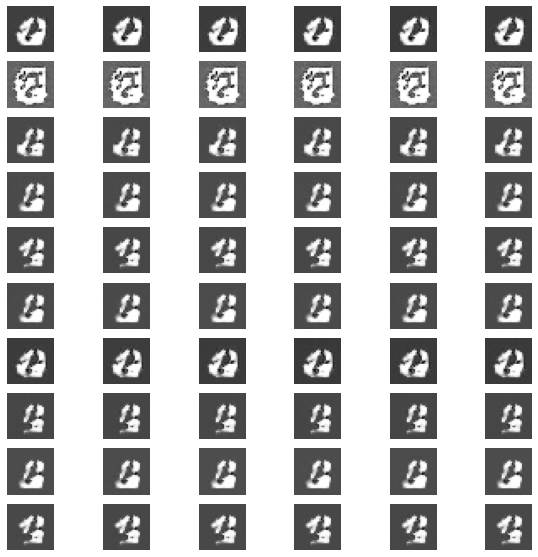

Time for epoch 68 is 25.123828172683716 sec


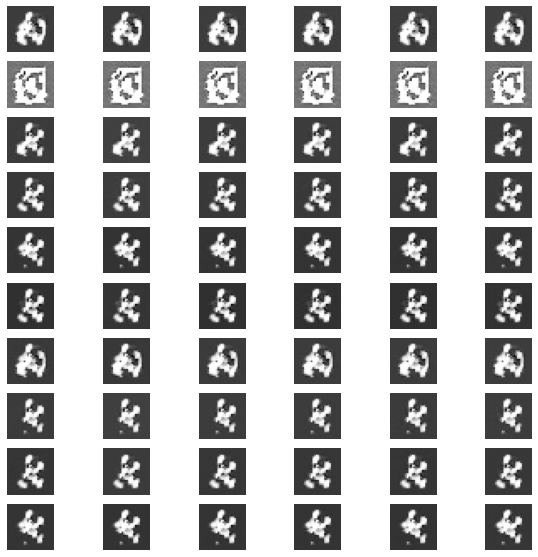

Time for epoch 69 is 24.91260075569153 sec


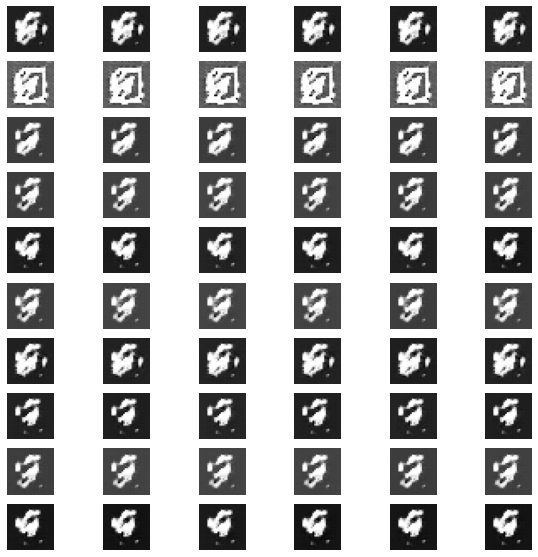

Time for epoch 70 is 24.86030387878418 sec


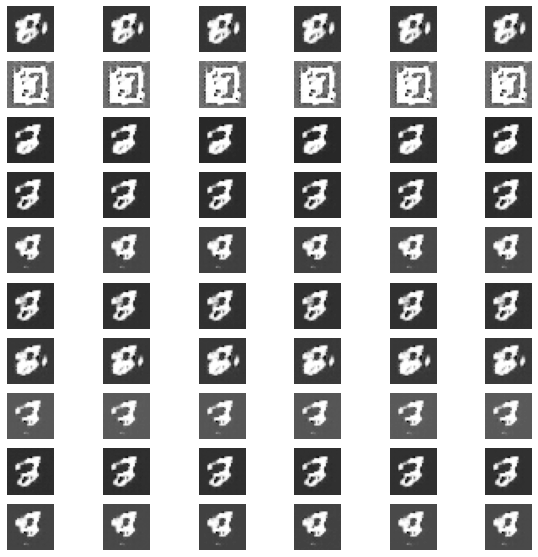

Time for epoch 71 is 24.996774673461914 sec


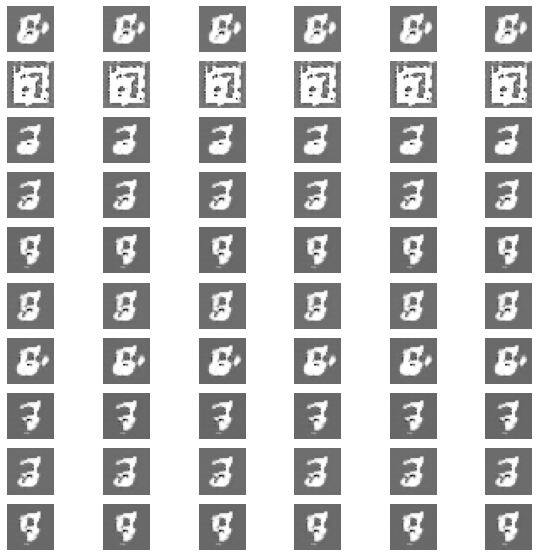

Time for epoch 72 is 24.98351216316223 sec


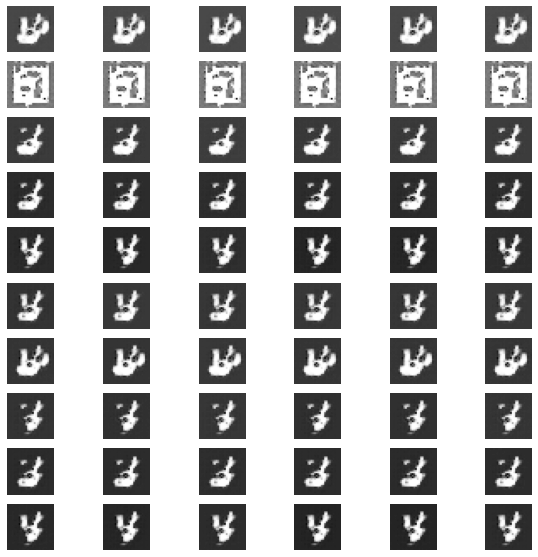

Time for epoch 73 is 24.93200397491455 sec


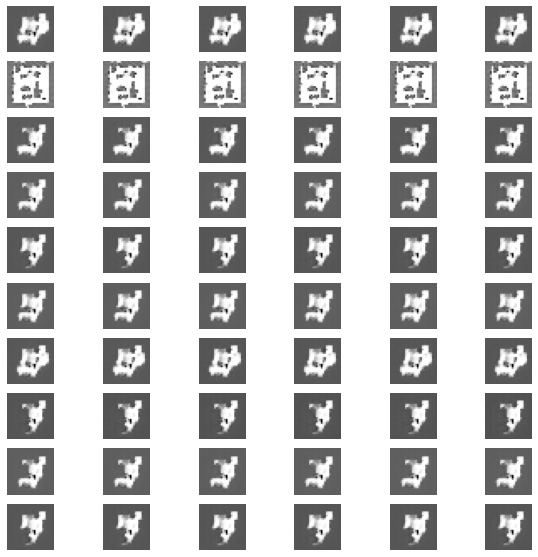

Time for epoch 74 is 25.016919136047363 sec


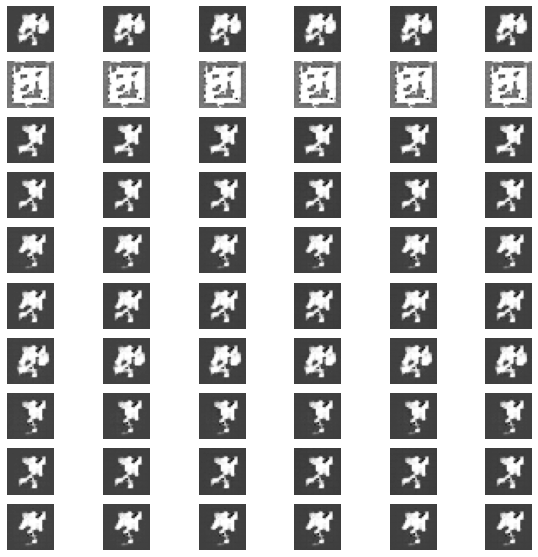

Time for epoch 75 is 24.94820785522461 sec


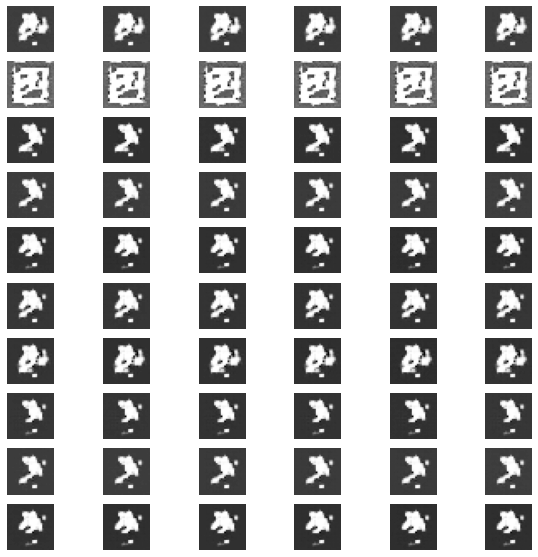

Time for epoch 76 is 24.782440662384033 sec


In [ ]:
c_train(train_dataset, EPOCHS)